## Descriptive statistics

In [74]:
import seaborn as sns
from fitter import Fitter, get_common_distributions, get_distributions
import pandas as pd
import numpy as np
from sklearn.datasets import load_wine
import matplotlib.pyplot as plt
from scipy import stats
from collections import defaultdict

plt.style.use('fivethirtyeight')

wine = load_wine()

features, labels = wine.data, wine.target
data_df = pd.DataFrame(wine.data, columns=wine.feature_names)
data_df['target'] = wine.target

In [8]:
data_df.columns[-1]

'target'

Fitting 4 distributions: 100%|███████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 14.63it/s]


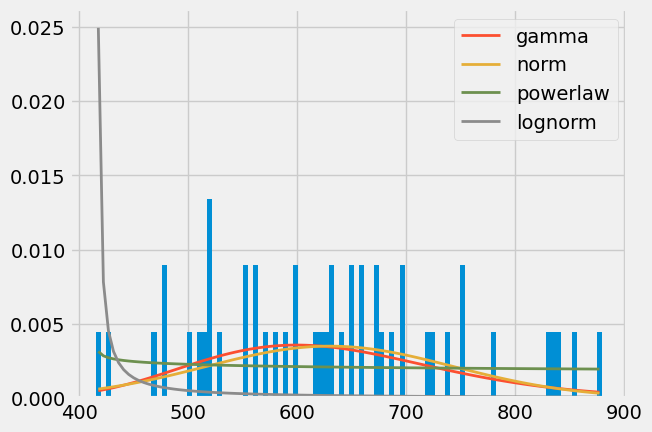

In [10]:
# For each feature, for each cluster find the distribution that best fits the data
# K-means assumes a circular cluster layout, while GMM is generative and assumes a gaussian.
# HAC does not assume anything on the underlying function generating the data, 
# therefore, it can deal with pretty complex layouts.

dfs = {}
fitter_objects = {}
dists = {"feature":[],
         "cluster_id":[],
         "distribution":[],
         "sumsquare_error":[]}
for idx,  col in enumerate(data_df.columns[:-1]):
    for cid in data_df['target'].unique():
        cluster_feature = data_df.loc[data_df['target']==cid][col].values
        
        f = Fitter(cluster_feature,
                   distributions= ['norm','gamma','powerlaw','lognorm'])
        f.fit()
        
        best_dist = list(f.get_best(method = 'sumsquare_error').keys())[0]

        dfs[col] = f.summary()
        fitter_objects[col] = f
        
        dists['feature'].append(col)
        dists['cluster_id'].append(cid)
        dists['distribution'].append(best_dist)
        dists['sumsquare_error'].append(f.summary().iloc[0]['sumsquare_error'])


In [173]:
# We see that the most common distributions are the lognormal and gamma (which look super similar tbh.)
dists_df = pd.DataFrame(dists)
distribution_counts = pd.DataFrame(dists_df[['distribution','cluster_id']].value_counts())
#.plot(kind='bar',figsize=[16,9])


In [180]:
distribution_counts.reset_index(inplace=True)
distribution_counts

,index,distribution,cluster_id,0
0,0,lognorm,1,7
1,1,gamma,2,6
2,2,norm,0,5
3,3,gamma,0,4
4,4,gamma,1,4
5,5,lognorm,0,4
6,6,lognorm,2,4
7,7,norm,1,2
8,8,norm,2,2
9,9,powerlaw,2,1


In [181]:
distribution_counts.drop('index',axis=1,inplace=True)

<AxesSubplot: xlabel='cluster_id'>

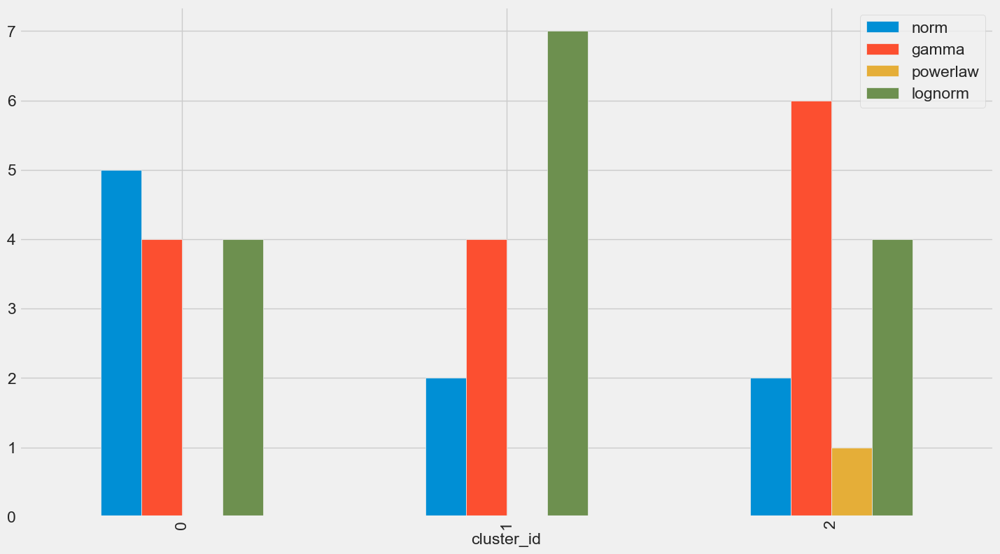

In [191]:
grouped_dict = defaultdict(list)

for dist in ['norm','gamma','powerlaw','lognorm']:
    cur_dist = distribution_counts.loc[distribution_counts['distribution']==dist]
    grouped_dict['distribution'].append(dist)
    for cid in range(1,4):
        cur_cid = cur_dist.loc[cur_dist['cluster_id']==cid]
        if cur_cid.shape[0]==0:
            grouped_dict["cluster_"+str(cid)].append(0)
        else:
            grouped_dict["cluster_"+str(cid)].append(cur_cid[0].values[0])
#pd.DataFrame(grouped_dict).set_index('distribution').plot(kind='bar',figsize=[16,9])


grouped_dict = defaultdict(list)
for cid in range(0,3):
    cur_cluster = distribution_counts.loc[distribution_counts['cluster_id']==cid]
    grouped_dict['cluster_id'].append(cid)
    for dist in ['norm','gamma','powerlaw','lognorm']:
        cur_dist = cur_cluster.loc[cur_cluster['distribution']==dist]
        if cur_dist.shape[0]==0:
            grouped_dict[dist].append(0)
        else:
            grouped_dict[dist].append(cur_dist[0].values[0])
distribution_frame = pd.DataFrame(grouped_dict).set_index('cluster_id')
distribution_frame.plot(kind='bar',figsize=[16,9])

In [192]:
distribution_frame

,norm,gamma,powerlaw,lognorm
cluster_id,,,,
0,5,4,0,4
1,2,4,0,7
2,2,6,1,4


array([[<AxesSubplot: title={'center': 'standard_deviation'}>]],
      dtype=object)

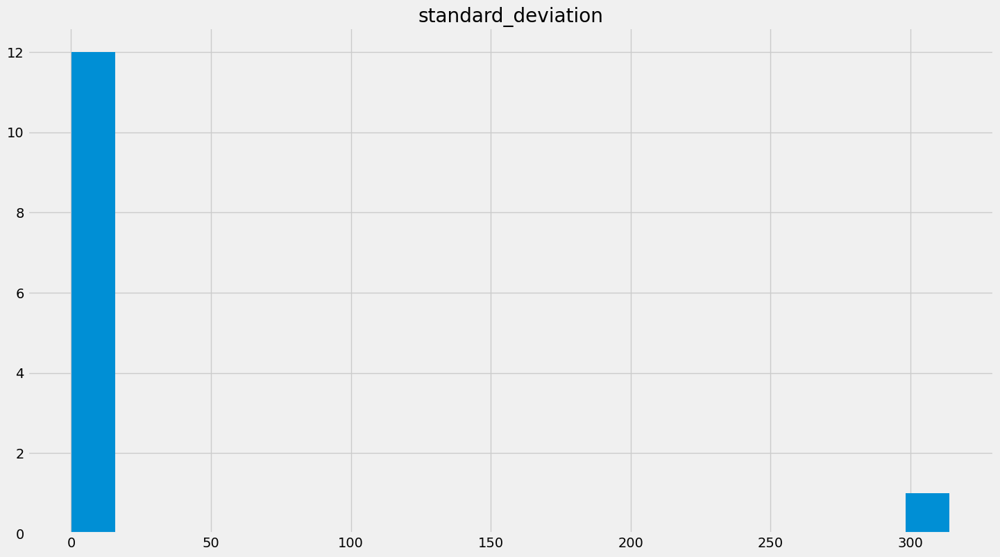

In [13]:
# Measuring the standard deviation in order to assess which features 
# would probably create a multivariate gaussian with very different stds - this might be problematic for K-Means
# However, instead of this i end up simply calculating the pr. cluster correlation matrix
# I suspect that a high, absolute, correlation between features will produce a cluster that benefits GMM
stds = {}
std_list = []

for idx,  feature_name in enumerate(wine['feature_names']):
    sd = np.std(features[:,idx])
        
    stds[feature_name]= sd
    std_list.append(sd)
pd.DataFrame({'standard_deviation':stds}).hist(figsize=[16,9],bins=20)

In [14]:
stds

{'alcohol': 0.8095429145285168,
 'malic_acid': 1.1140036269797893,
 'ash': 0.27357229442643255,
 'alcalinity_of_ash': 3.3301697576582128,
 'magnesium': 14.242307673359806,
 'total_phenols': 0.6240905641965369,
 'flavanoids': 0.996048950379233,
 'nonflavanoid_phenols': 0.12410325988364795,
 'proanthocyanins': 0.5707488486199379,
 'color_intensity': 2.3117646609525573,
 'hue': 0.22792860656507252,
 'od280/od315_of_diluted_wines': 0.7079932646716005,
 'proline': 314.0216568419878}

In [15]:
{k: v for k, v in sorted(stds.items(), key=lambda item: item[1])}

{'nonflavanoid_phenols': 0.12410325988364795,
 'hue': 0.22792860656507252,
 'ash': 0.27357229442643255,
 'proanthocyanins': 0.5707488486199379,
 'total_phenols': 0.6240905641965369,
 'od280/od315_of_diluted_wines': 0.7079932646716005,
 'alcohol': 0.8095429145285168,
 'flavanoids': 0.996048950379233,
 'malic_acid': 1.1140036269797893,
 'color_intensity': 2.3117646609525573,
 'alcalinity_of_ash': 3.3301697576582128,
 'magnesium': 14.242307673359806,
 'proline': 314.0216568419878}

/Users/askemeineche/opt/anaconda3/lib/python3.9/site-packages/pandas/plotting/_matplotlib/core.py:1070: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(


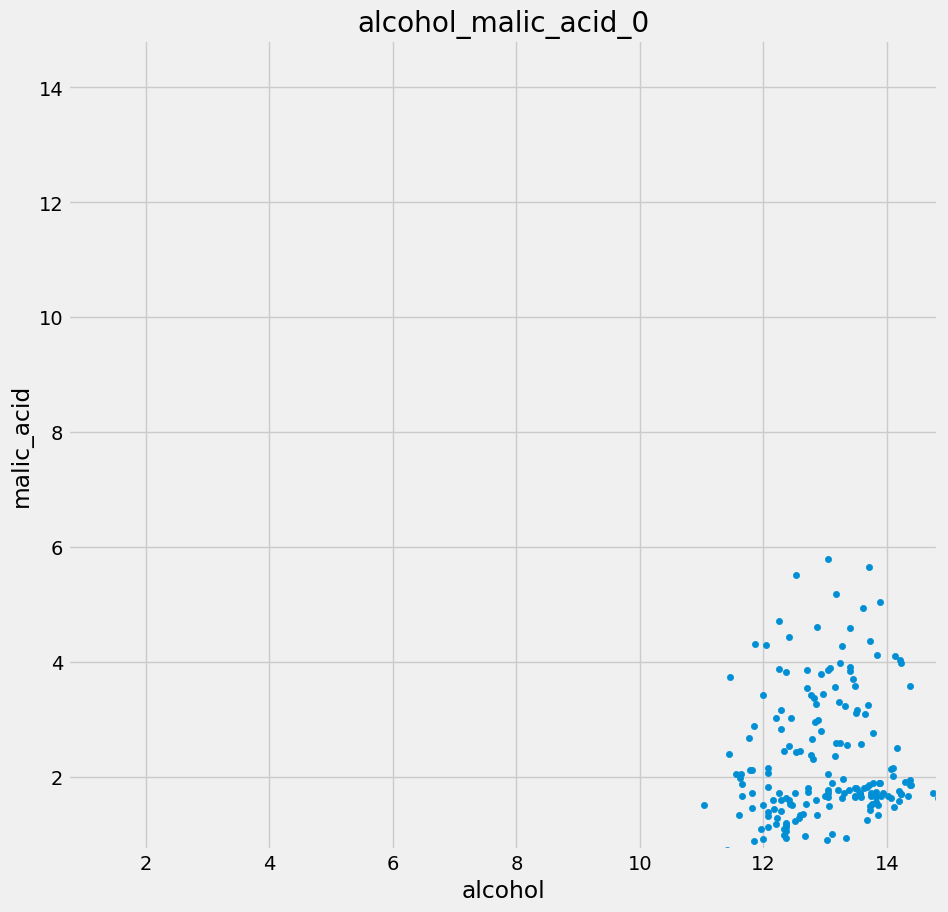

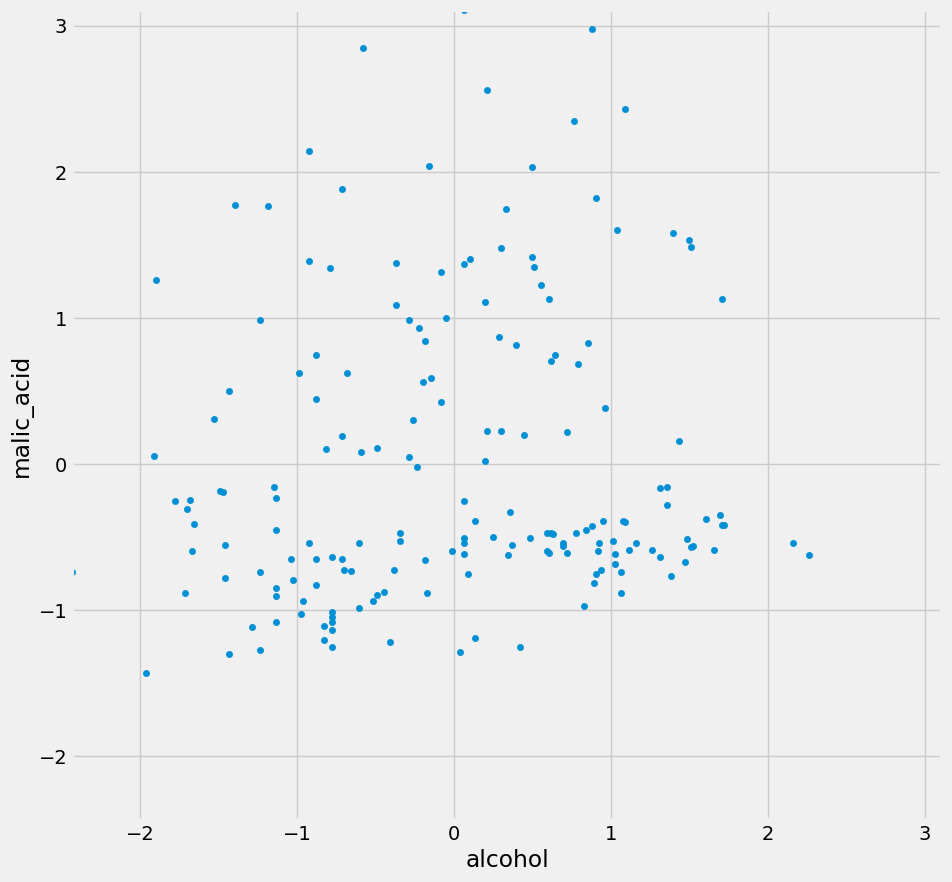

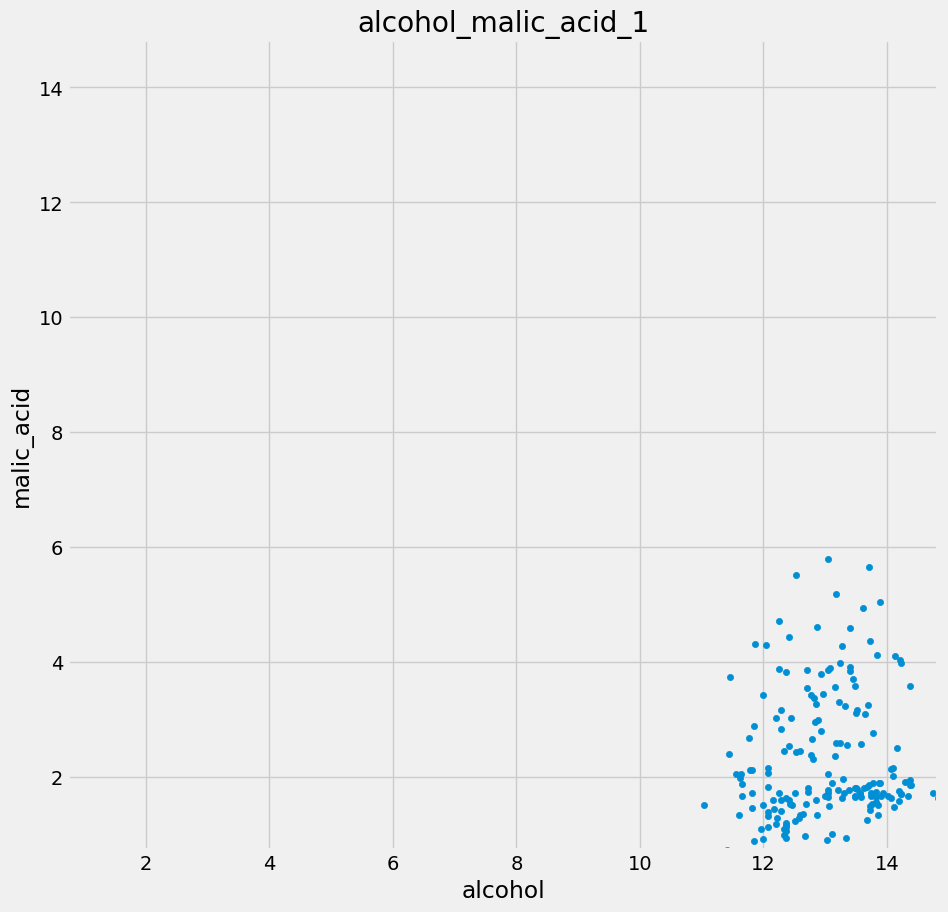

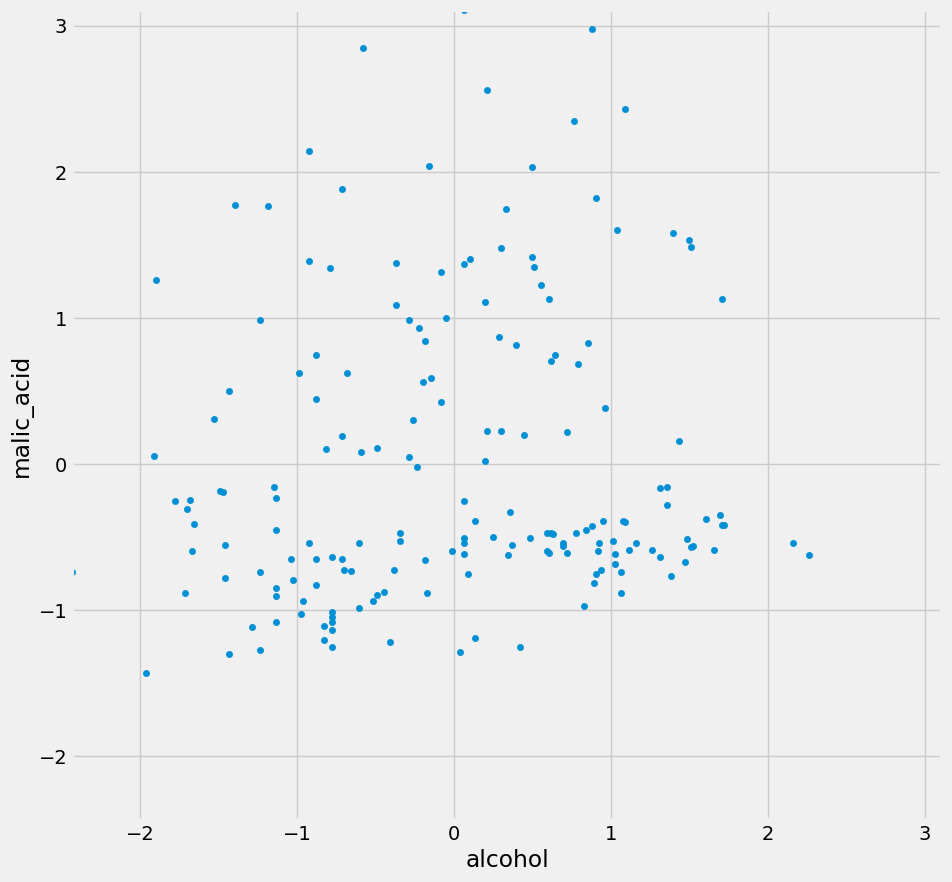

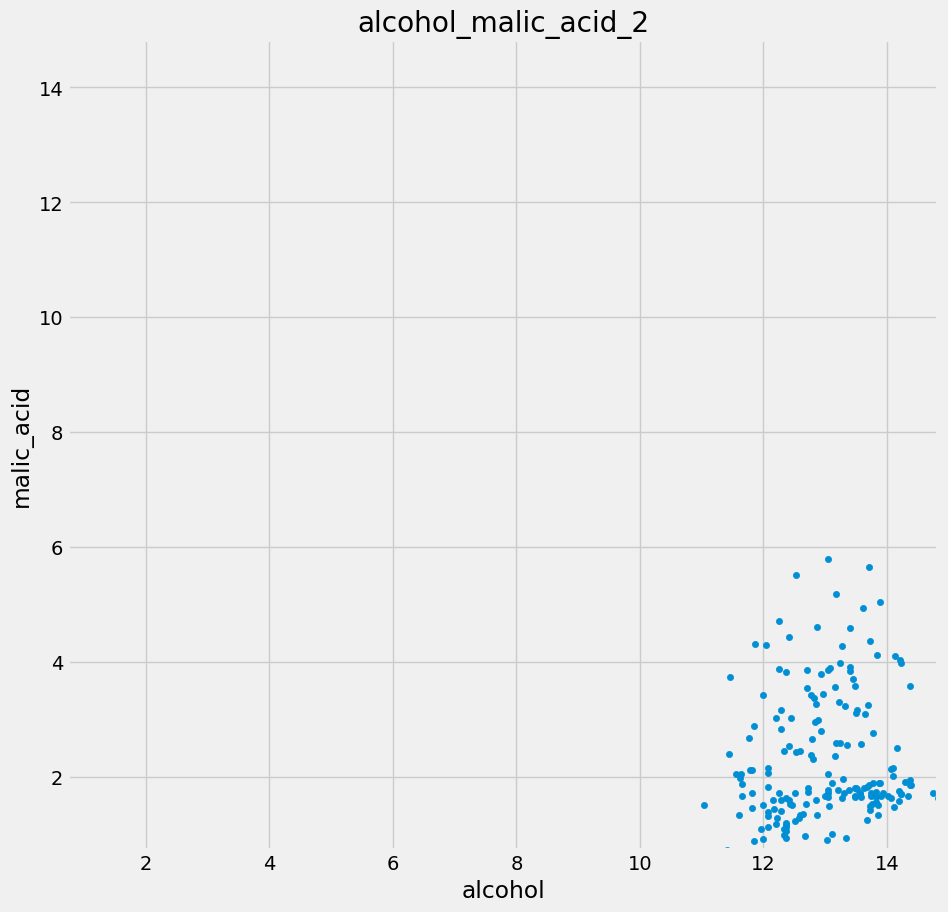

...

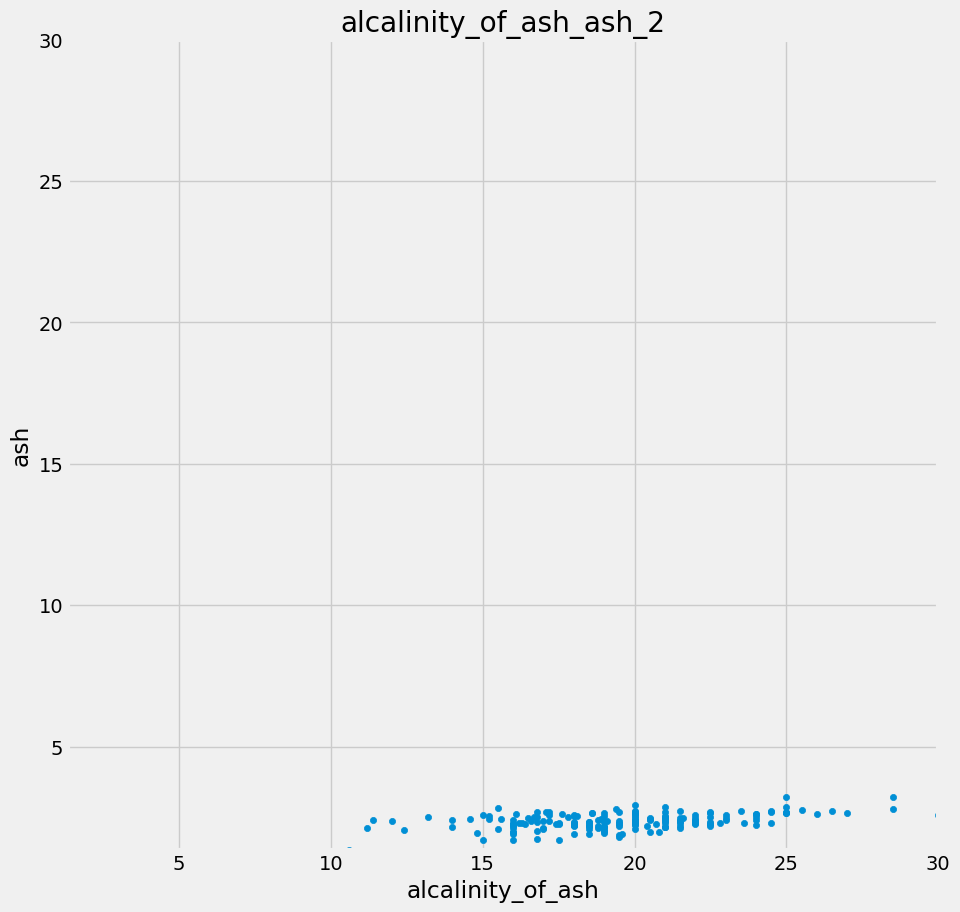

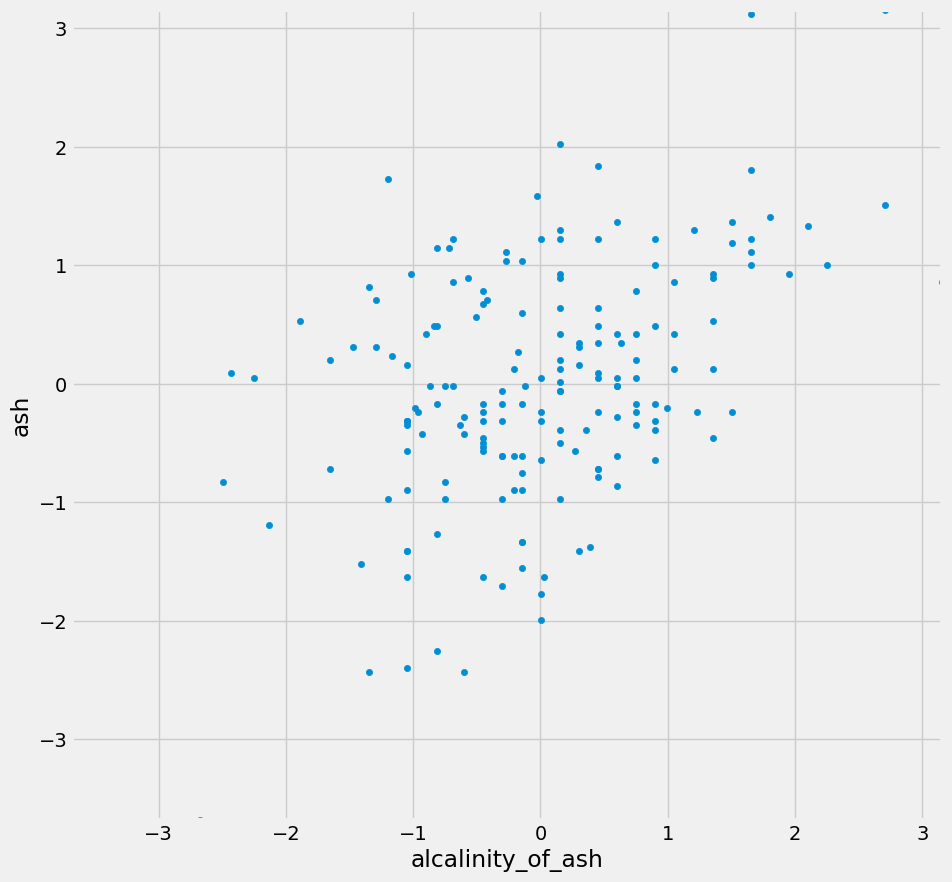

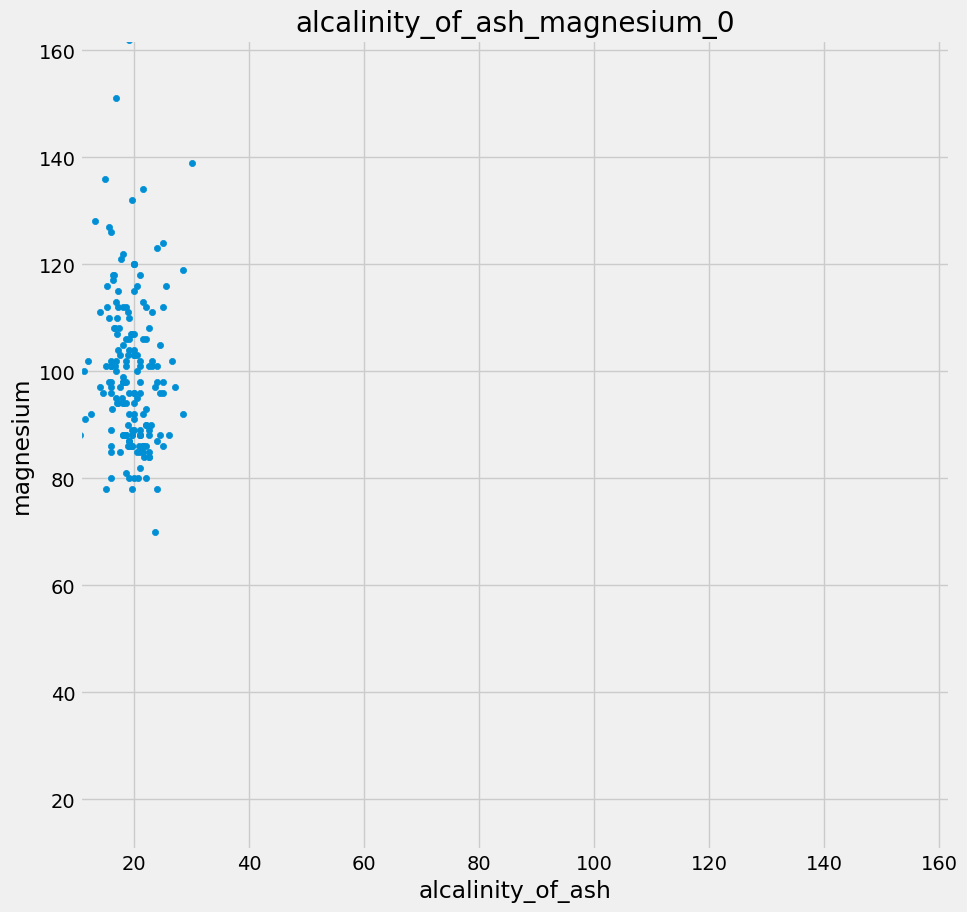

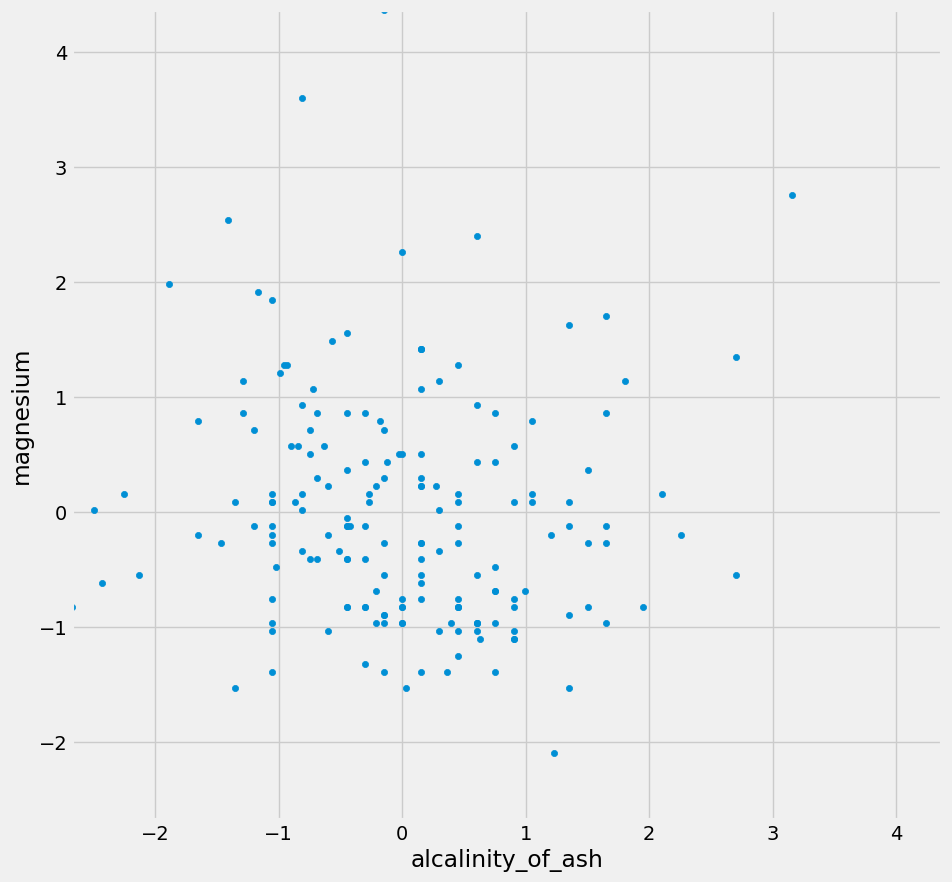

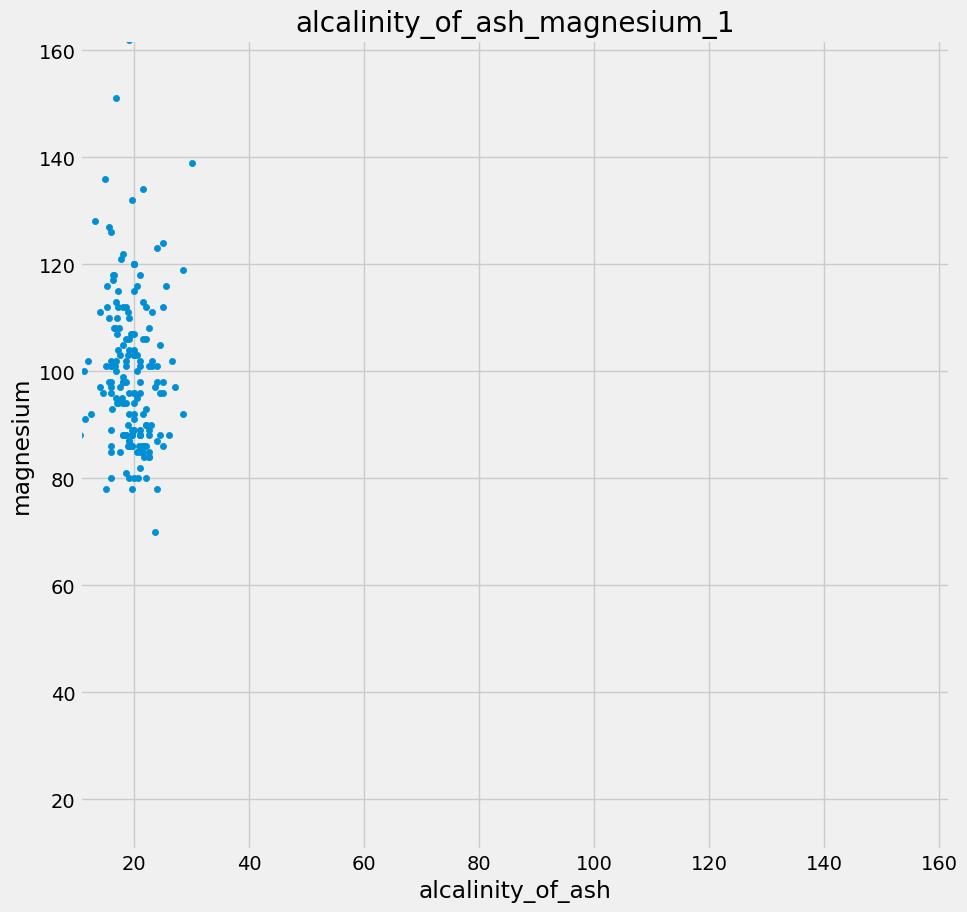

KeyboardInterrupt: 

In [16]:
# Here i plot the different features against oneanother a long with an identical plot of their z-normalized counterparts
# It is not that informative tbh.
for feature_1 in data_df.columns[:-1]: 
    for feature_2 in data_df.columns[:-1]: 
        if feature_1==feature_2:
            continue
        for cid in data_df['target'].unique():
            min_idx = wine['feature_names'].index(feature_1)
            max_idx = wine['feature_names'].index(feature_2)

            std_df = pd.DataFrame({feature_1:features[:,min_idx],
                      feature_2:features[:,max_idx]})

            range_min = std_df.min()
            range_max = std_df.max()

            plotting_range= [min(range_min.values),max(range_max.values)]

            std_df.plot(kind='scatter',
                        x=feature_1,
                        y=feature_2,
                        figsize=[10,10],
                        xlim=plotting_range,
                        ylim=plotting_range)


            std_df[feature_1] = stats.zscore(std_df[feature_1])
            std_df[feature_2] = stats.zscore(std_df[feature_2])

            range_min = std_df.min()
            range_max = std_df.max()

            plotting_range= [min(range_min.values),max(range_max.values)]
            plt.title("{}_{}_{}".format(feature_1,feature_2,cid))
            std_df.plot(kind='scatter',
                        x=feature_1,
                        y=feature_2,
                        figsize=[10,10],
                        xlim=plotting_range,
                        ylim=plotting_range)
            plt.show()

## Correlation Matrices

In [17]:
%%time
from sklearn.preprocessing import StandardScaler 

CPU times: user 7 µs, sys: 0 ns, total: 7 µs
Wall time: 11 µs


<Figure size 1000x1000 with 0 Axes>

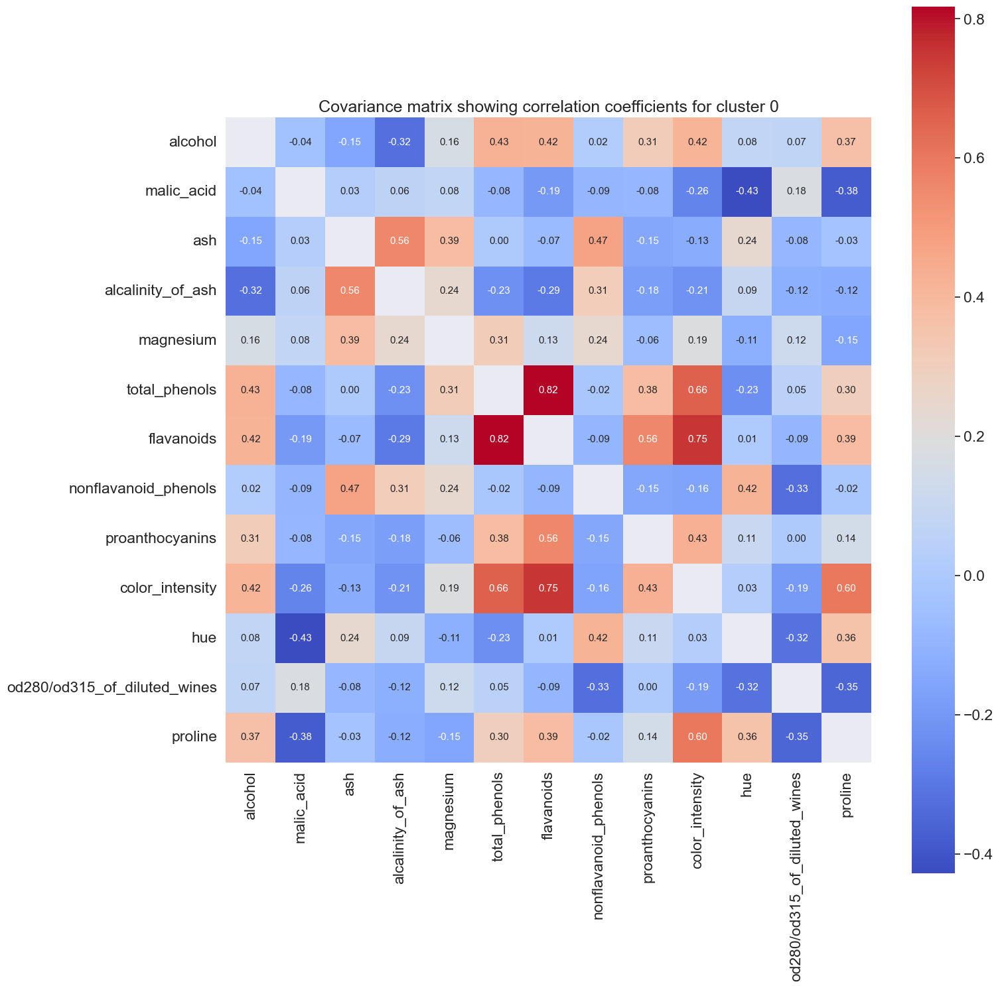

<Figure size 1000x1000 with 0 Axes>

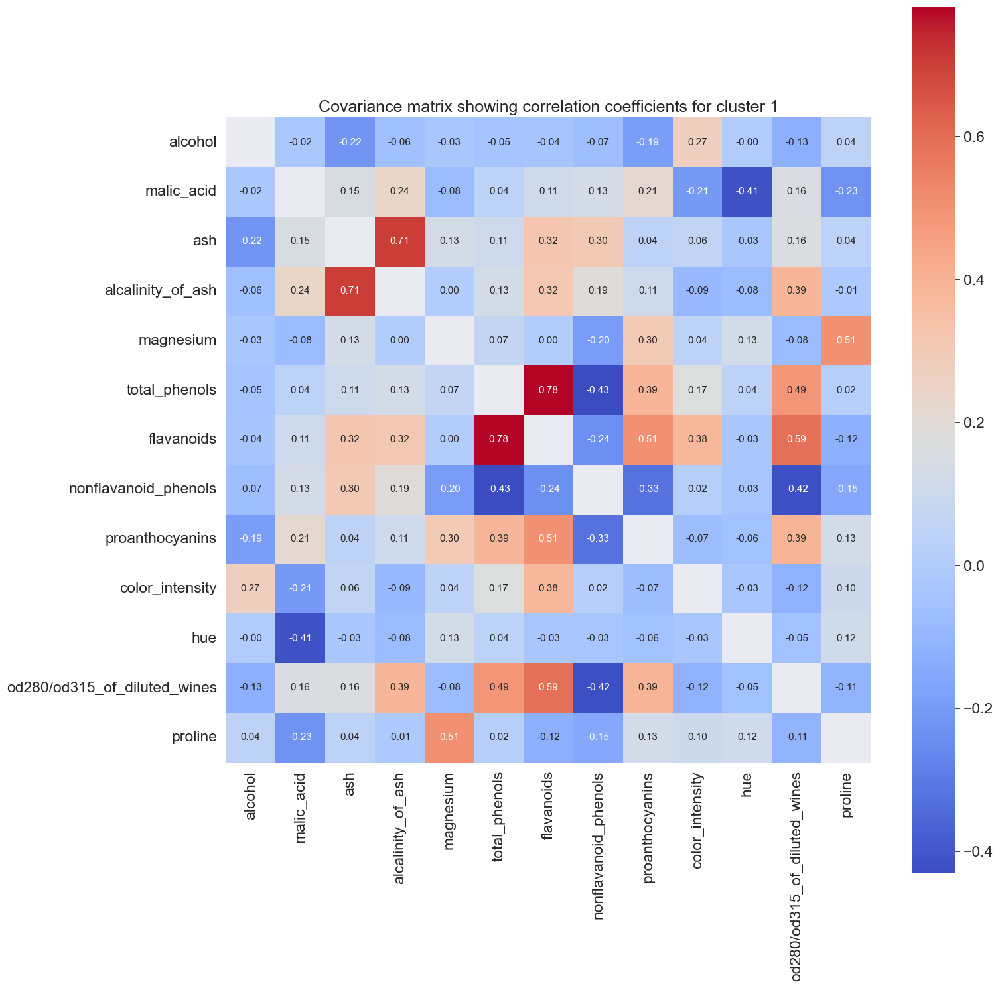

<Figure size 1000x1000 with 0 Axes>

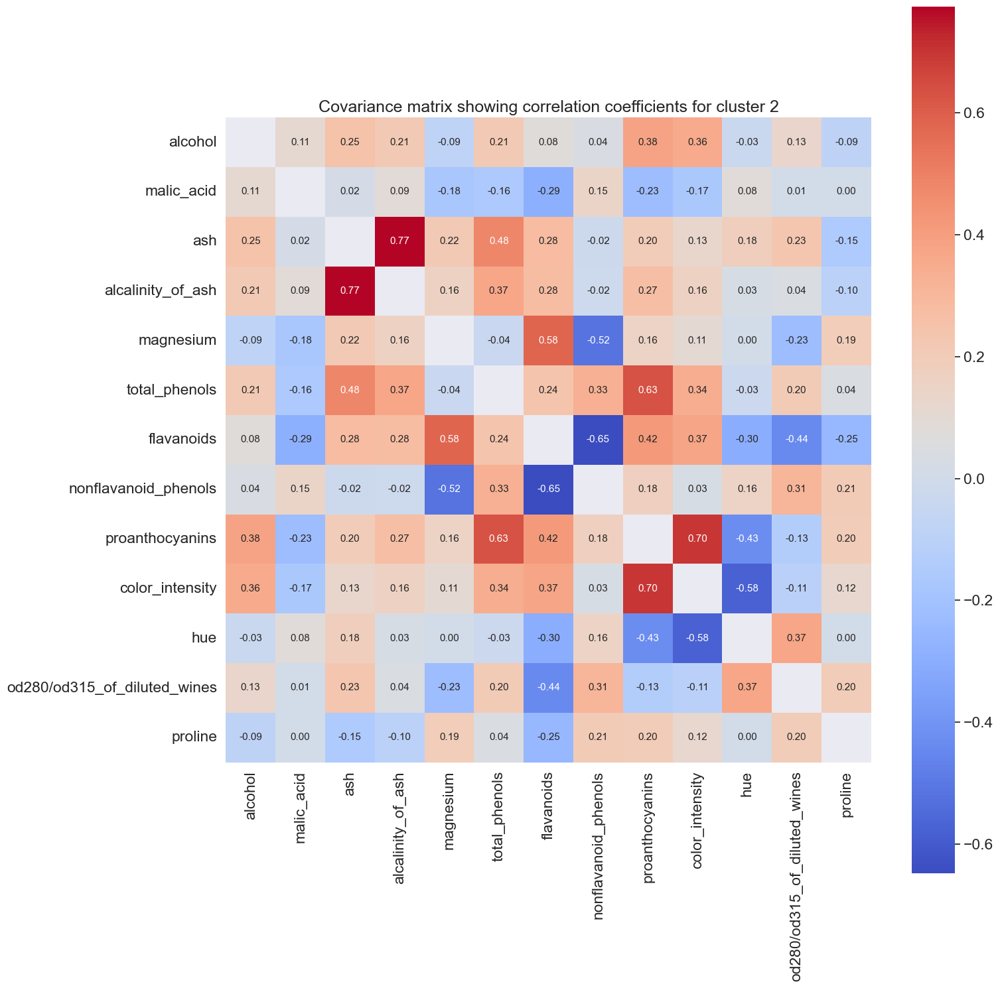

In [18]:
cid_dict = {}
for cid in data_df.target.unique():
    stdsc = StandardScaler() 
    subset = data_df.loc[data_df['target']==cid]
    feature_cols = subset[subset.columns[:-1]]
    
    X_std = stdsc.fit_transform(feature_cols.values)

    cov_mat =np.cov(X_std.T)
    cov_mat[cov_mat>0.99]=None
    plt.figure(figsize=(10,10))
    sns.set(font_scale=1.5)
    plt.figure(figsize=[16,16])
    hm = sns.heatmap(cov_mat,
                     cbar=True,
                     annot=True,
                     square=True,
                     fmt='.2f',
                     annot_kws={'size': 11},
                     cmap='coolwarm',                 
                     yticklabels=wine['feature_names'],
                     xticklabels=wine['feature_names']
                    )
    cur_cid_df = pd.DataFrame(cov_mat,index=wine['feature_names'],columns=wine['feature_names'])
    cid_dict[cid]=cur_cid_df
    plt.title('Covariance matrix showing correlation coefficients for cluster {}'.format(cid), size = 18)
    plt.tight_layout()
    plt.show()

0 2.745375308569478
0 0.6971608143060565


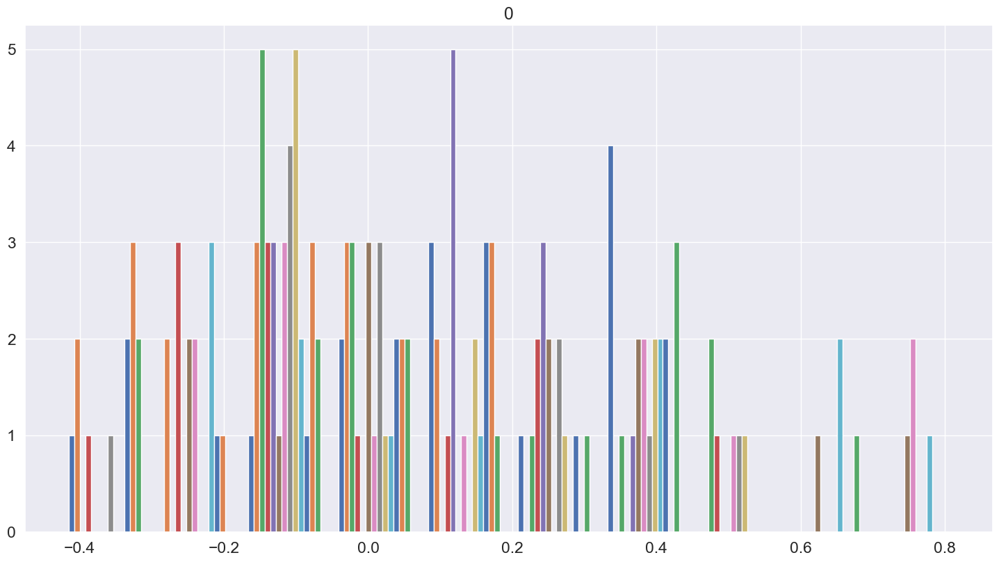

1 2.1503854771038684
1 0.7507556070743732


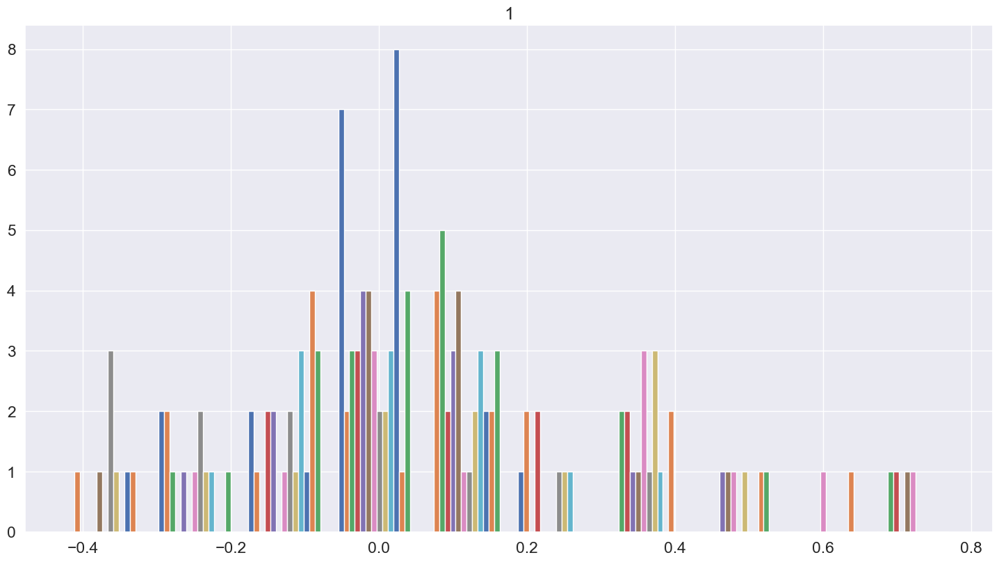

2 2.6573789175017075
2 0.8063467266085869


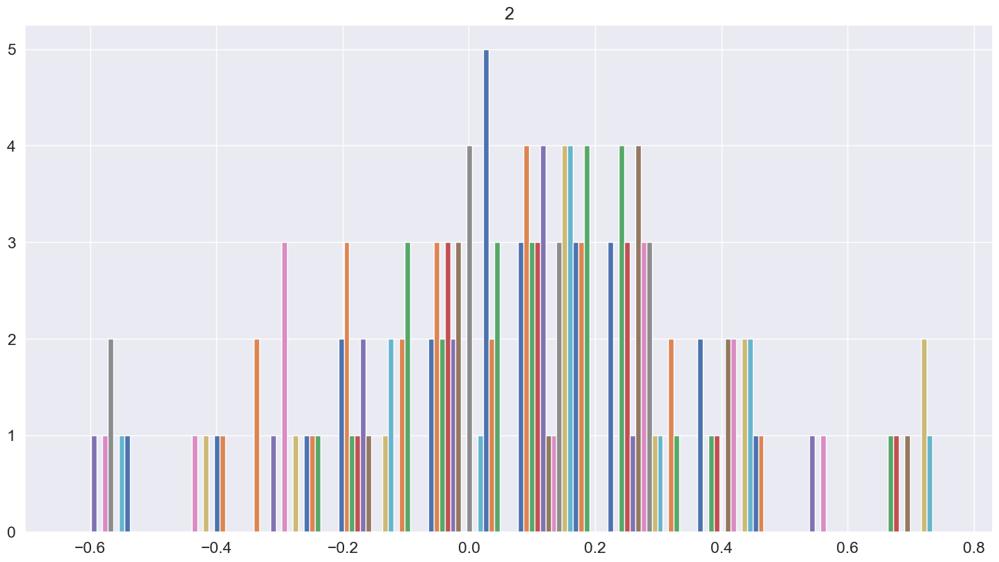

In [19]:
# Here i calculate the mean, std of the correlations and plot a histogram of said correlations
# I suspect that clusters with highly correlated features (negatively and positively) benefit GMM over Kmeans
# I have yet to show this with the actual models, however, we can 'simply' try to hold out certain features,
# With certain distributions and see how the models perform. 

for cid,cur_df in cid_dict.items():
    print(cid,cur_df.abs().sum().mean())
    print(cid,cur_df.abs().sum().std())
    plt.figure(figsize=[16,9])
    plt.hist(cur_df)
    plt.title(cid)
    plt.show()

/Users/askemeineche/opt/anaconda3/lib/python3.9/site-packages/pandas/plotting/_matplotlib/core.py:1070: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(


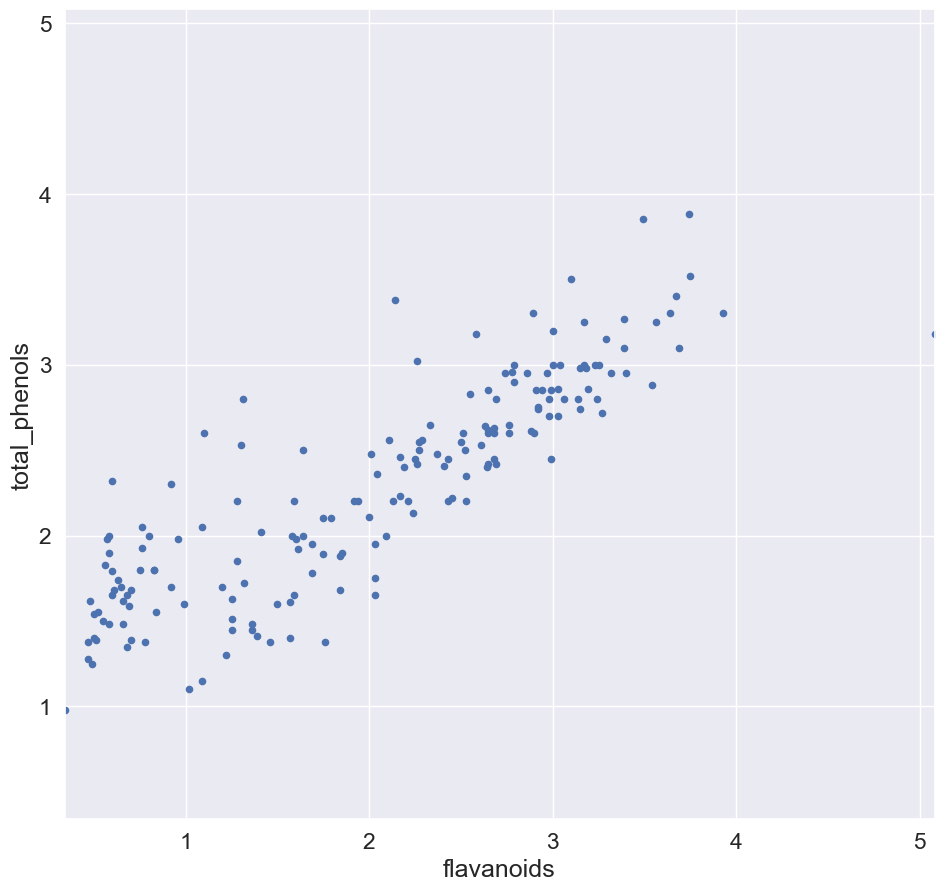

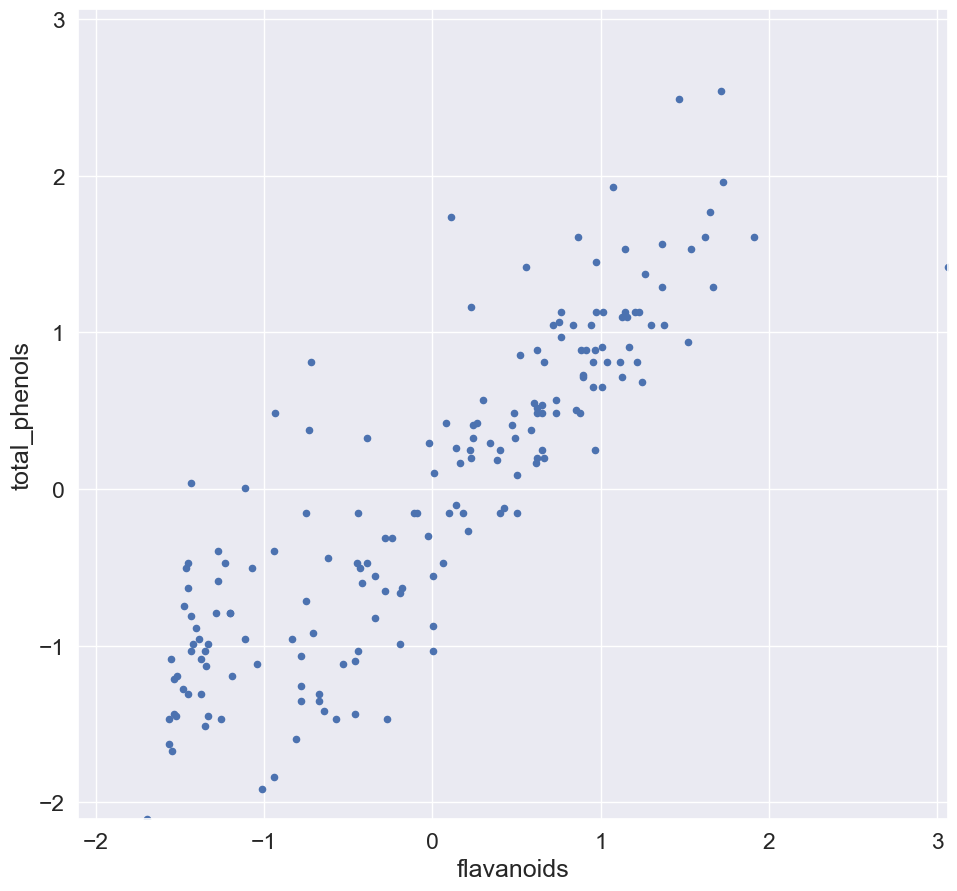

In [90]:
# Here you can simply plot to features against eachother.
# not that clever
feature_1,feature_2 = "flavanoids","total_phenols"
min_idx = wine['feature_names'].index(feature_1)
max_idx = wine['feature_names'].index(feature_2)

std_df = pd.DataFrame({feature_1:features[:,min_idx],
          feature_2:features[:,max_idx]})

range_min = std_df.min()
range_max = std_df.max()

plotting_range= [min(range_min.values),max(range_max.values)]

std_df.plot(kind='scatter',
            x=feature_1,
            y=feature_2,
            figsize=[10,10],
            xlim=plotting_range,
            ylim=plotting_range)


std_df[feature_1] = stats.zscore(std_df[feature_1])
std_df[feature_2] = stats.zscore(std_df[feature_2])

range_min = std_df.min()
range_max = std_df.max()

plotting_range= [min(range_min.values),max(range_max.values)]
std_df.plot(kind='scatter',
            x=feature_1,
            y=feature_2,
            figsize=[10,10],
            xlim=plotting_range,
            ylim=plotting_range)
plt.show()

In [26]:
cid_dict[0]

,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315_of_diluted_wines,proline
alcohol,NaN,-0.041212,-0.151157,-0.323856,0.162108,0.427940,0.422057,0.015929,0.312874,0.415331,0.081399,0.071022,0.366864
malic_acid,-0.041212,NaN,0.026673,0.061066,0.080685,-0.084954,-0.194576,-0.090907,-0.082191,-0.262028,-0.427222,0.176231,-0.379054
ash,-0.151157,0.026673,NaN,0.558801,0.389145,0.004884,-0.071669,0.473934,-0.147979,-0.126362,0.243338,-0.083000,-0.030034
alcalinity_of_ash,-0.323856,0.061066,0.558801,NaN,0.242446,-0.226844,-0.292053,0.307473,-0.176621,-0.214588,0.094583,-0.119733,-0.124547
magnesium,0.162108,0.080685,0.389145,0.242446,NaN,0.312538,0.125459,0.241339,-0.060060,0.187844,-0.113306,0.122731,-0.150462
total_phenols,0.427940,-0.084954,0.004884,-0.226844,0.312538,NaN,0.817643,-0.017285,0.380043,0.661294,-0.228198,0.054082,0.300080
flavanoids,0.422057,-0.194576,-0.071669,-0.292053,0.125459,0.817643,NaN,-0.091082,0.558083,0.754346,0.007998,-0.090055,0.387006
nonflavanoid_phenols,0.015929,-0.090907,0.473934,0.307473,0.241339,-0.017285,-0.091082,NaN,-0.147026,-0.155089,0.418932,-0.329065,-0.015598
proanthocyanins,0.312874,-0.082191,-0.147979,-0.176621,-0.060060,0.380043,0.558083,-0.147026,NaN,0.432018,0.105729,0.003160,0.144617
color_intensity,0.415331,-0.262028,-0.126362,-0.214588,0.187844,0.661294,0.754346,-0.155089,0.432018,NaN,0.028714,-0.190121,0.598922


In [48]:
featurelist = cid_dict[0].columns.tolist()

feature_frame = {'feature':[],
                 "cluster":[],
                 'mean_correlation':[]}

for cid in cid_dict.keys():
    for feature in featurelist:
    
        current = cid_dict[cid].copy()

        current.drop(feature,axis=0,inplace=True)
        current.drop(feature,axis=1,inplace=True)
        
        current_corr = current.corr()
        dim = current_corr.shape[0]
        abs_corr = abs(current_corr.values.reshape(1,dim**2))
        abs_corr[abs_corr>=1] = 0
        
        
        feature_frame['feature'].append(feature)
        feature_frame['cluster'].append(cid)
        feature_frame['mean_correlation'].append(abs_corr.mean())
        
feature_frame = pd.DataFrame(feature_frame)


In [52]:
feature_frame[['feature','mean_correlation']]\
.groupby('feature')\
.mean()\
.sort_values('mean_correlation',ascending=False)

,mean_correlation
feature,
magnesium,0.398156
ash,0.386384
hue,0.381140
nonflavanoid_phenols,0.380785
malic_acid,0.377345
proline,0.372199
od280/od315_of_diluted_wines,0.370347
total_phenols,0.369676
alcohol,0.362366


# Clustering Attempt

In [100]:
from sklearn.datasets import load_wine
import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
#from sklearn.preprocessing import Normalizer


from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score, adjusted_rand_score, adjusted_mutual_info_score

from sklearn.decomposition import PCA

import matplotlib.pyplot as plt
from tqdm import tqdm
plt.style.use('fivethirtyeight')

In [107]:
frames = []
for i in tqdm(range(100)):

    score_frame = {'Distribution':[],
                   "Clustering Method":[],
                   "Adjusted Rand Index":[],
                   "Adjusted Mutual Info Score":[]}


    datasets = defaultdict(dict)
    for dist in dists_df.distribution.unique():
        features_to_model = dists_df.loc[dists_df['distribution']==dist]['feature'].unique().tolist()

        labels = data_df['target'].values
        features = data_df[features_to_model].values

        X_train, X_test, y_train, y_test = train_test_split(features,
                         labels,
                         test_size=0.2,
                         #random_state=42,
                         stratify=labels)


        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_test = scaler.transform(X_test)

        datasets[dist]['x_test'] = X_test
        datasets[dist]['y_test'] = y_test

        # Clustering
        # KMeans
        kmeans = KMeans(n_clusters=3, random_state=42)
        kmeans.fit(X_train)
        y_pred = kmeans.predict(X_test)
        datasets[dist]['y_pred'] = y_pred
        score_frame['Clustering Method'].append('KMeans')
        score_frame['Adjusted Rand Index'].append(adjusted_rand_score(y_test, y_pred))
        score_frame['Adjusted Mutual Info Score'].append(adjusted_mutual_info_score(y_test, y_pred))
        score_frame['Distribution'].append(dist)


        # Gaussian Mixture
        gm = GaussianMixture(n_components=3, random_state=42)# 42
        gm.fit(X_train)
        y_pred = gm.predict(X_test)
        score_frame['Clustering Method'].append('Gaussian Mixture')
        score_frame['Adjusted Rand Index'].append(adjusted_rand_score(y_test, y_pred))
        score_frame['Adjusted Mutual Info Score'].append( adjusted_mutual_info_score(y_test, y_pred))
        score_frame['Distribution'].append(dist)
        
        
        agg = AgglomerativeClustering(n_clusters=3)
        agg.fit(X_train)
        y_pred = agg.fit_predict(X_test)
        score_frame['Clustering Method'].append('Agglomerative Clustering')
        score_frame['Adjusted Rand Index'].append(adjusted_rand_score(y_test, y_pred))
        score_frame['Adjusted Mutual Info Score'].append( adjusted_mutual_info_score(y_test, y_pred))
        score_frame['Distribution'].append(dist)

    score_frame = pd.DataFrame(score_frame)
    score_frame.sort_values('Adjusted Mutual Info Score',ascending=False)
    frames.append( score_frame[["Clustering Method",'Distribution','Adjusted Mutual Info Score']].groupby(["Clustering Method","Distribution"]).mean().reset_index())
    

100%|████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:17<00:00,  5.76it/s]


In [119]:
all_dists = dists_df.distribution.unique()
evaluation_frame = pd.concat(frames).groupby(['Clustering Method',"Distribution"]).mean()
evaluation_frame.reset_index(inplace=True)
def get_max_dist(dist,evaluation_frame=evaluation_frame):
    max_dist = evaluation_frame.loc[evaluation_frame['Distribution']==dist].sort_values("Adjusted Mutual Info Score",ascending=False).head(1)['Clustering Method'].values[0]
    return max_dist

{dist:get_max_dist(dist) for dist in all_dists}

{'norm': 'Gaussian Mixture',
 'lognorm': 'KMeans',
 'gamma': 'Gaussian Mixture',
 'powerlaw': 'Gaussian Mixture'}

In [124]:
!pip install pomegranate

  Using cached pomegranate-0.14.8-cp39-cp39-macosx_10_9_x86_64.whl (7.3 MB)


In [127]:
from pomegranate import GeneralMixtureModel,LogNormalDistribution,GammaDistribution,GaussianDistribution

x = np.array(df['foo']).reshape(-1, 1)

model = GeneralMixtureModel.from_samples(LogNormalDistribution, n_components=2, X=x)
model.fit(x)
pomegranate_clusters = model.predict(x)

ModuleNotFoundError: No module named 'pomegranate'

## Report Notes
The dataset contains 13 numerical features, mostly in the range of zero to 100, except for proline, which ranges up to over 1000. 
The target variable is an id for three different cultivars growing the grapes. The clusters differ in size with the most populous being 150% larger than the least populous. As the downstream task is to perform clustering on the dataset we fit each cluster in each feature to a distribution. This will help choose the clustering method down

In [121]:
data_df['target'].value_counts()
from mrmr import mrmr_classif

1    71
0    59
2    48
Name: target, dtype: int64

In [154]:
%%time
#!pip install mrmr_selection

feature_ranking = dict()
ranked = []

for i in range(1,14):
    X = data_df[list(data_df.columns)[:-1]]
    y = data_df[list(data_df.columns)[-1]]
    selected_features = list(mrmr_classif(X=X, y=y, K=i))
    print(feature_ranking.values())
    print(selected_features)
    if ranked:
        for f in ranked:
            selected_features.pop(selected_features.index(f))
    
    feature_ranking[i] = selected_features[0]
    ranked+=selected_features
    ranked = list(set(ranked))
feature_ranking

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 643.50it/s]


dict_values([])
['flavanoids']


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 43.84it/s]


dict_values(['flavanoids'])
['flavanoids', 'color_intensity']


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 55.82it/s]


dict_values(['flavanoids', 'color_intensity'])
['flavanoids', 'color_intensity', 'proline']


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 67.03it/s]


dict_values(['flavanoids', 'color_intensity', 'proline'])
['flavanoids', 'color_intensity', 'proline', 'od280/od315_of_diluted_wines']


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 60.82it/s]


dict_values(['flavanoids', 'color_intensity', 'proline', 'od280/od315_of_diluted_wines'])
['flavanoids', 'color_intensity', 'proline', 'od280/od315_of_diluted_wines', 'alcohol']


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 60.96it/s]


dict_values(['flavanoids', 'color_intensity', 'proline', 'od280/od315_of_diluted_wines', 'alcohol'])
['flavanoids', 'color_intensity', 'proline', 'od280/od315_of_diluted_wines', 'alcohol', 'hue']


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 68.87it/s]


dict_values(['flavanoids', 'color_intensity', 'proline', 'od280/od315_of_diluted_wines', 'alcohol', 'hue'])
['flavanoids', 'color_intensity', 'proline', 'od280/od315_of_diluted_wines', 'alcohol', 'hue', 'total_phenols']


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 66.83it/s]


dict_values(['flavanoids', 'color_intensity', 'proline', 'od280/od315_of_diluted_wines', 'alcohol', 'hue', 'total_phenols'])
['flavanoids', 'color_intensity', 'proline', 'od280/od315_of_diluted_wines', 'alcohol', 'hue', 'total_phenols', 'alcalinity_of_ash']


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:00<00:00, 64.40it/s]


dict_values(['flavanoids', 'color_intensity', 'proline', 'od280/od315_of_diluted_wines', 'alcohol', 'hue', 'total_phenols', 'alcalinity_of_ash'])
['flavanoids', 'color_intensity', 'proline', 'od280/od315_of_diluted_wines', 'alcohol', 'hue', 'total_phenols', 'alcalinity_of_ash', 'malic_acid']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 35.35it/s]


dict_values(['flavanoids', 'color_intensity', 'proline', 'od280/od315_of_diluted_wines', 'alcohol', 'hue', 'total_phenols', 'alcalinity_of_ash', 'malic_acid'])
['flavanoids', 'color_intensity', 'proline', 'od280/od315_of_diluted_wines', 'alcohol', 'hue', 'total_phenols', 'alcalinity_of_ash', 'malic_acid', 'proanthocyanins']


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 15.47it/s]

dict_values(['flavanoids', 'color_intensity', 'proline', 'od280/od315_of_diluted_wines', 'alcohol', 'hue', 'total_phenols', 'alcalinity_of_ash', 'malic_acid', 'proanthocyanins'])
['flavanoids', 'color_intensity', 'proline', 'od280/od315_of_diluted_wines', 'alcohol', 'hue', 'total_phenols', 'alcalinity_of_ash', 'malic_acid', 'proanthocyanins', 'nonflavanoid_phenols']



100%|██████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:09<00:00,  1.22it/s]

dict_values(['flavanoids', 'color_intensity', 'proline', 'od280/od315_of_diluted_wines', 'alcohol', 'hue', 'total_phenols', 'alcalinity_of_ash', 'malic_acid', 'proanthocyanins', 'nonflavanoid_phenols'])
['flavanoids', 'color_intensity', 'proline', 'od280/od315_of_diluted_wines', 'alcohol', 'hue', 'total_phenols', 'alcalinity_of_ash', 'malic_acid', 'proanthocyanins', 'nonflavanoid_phenols', 'ash']



100%|██████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:04<00:00,  3.11it/s]

dict_values(['flavanoids', 'color_intensity', 'proline', 'od280/od315_of_diluted_wines', 'alcohol', 'hue', 'total_phenols', 'alcalinity_of_ash', 'malic_acid', 'proanthocyanins', 'nonflavanoid_phenols', 'ash'])
['flavanoids', 'color_intensity', 'proline', 'od280/od315_of_diluted_wines', 'alcohol', 'hue', 'total_phenols', 'alcalinity_of_ash', 'malic_acid', 'proanthocyanins', 'nonflavanoid_phenols', 'ash', 'magnesium']
CPU times: user 972 ms, sys: 199 ms, total: 1.17 s
Wall time: 36.1 s


{1: 'flavanoids',
 2: 'color_intensity',
 3: 'proline',
 4: 'od280/od315_of_diluted_wines',
 5: 'alcohol',
 6: 'hue',
 7: 'total_phenols',
 8: 'alcalinity_of_ash',
 9: 'malic_acid',
 10: 'proanthocyanins',
 11: 'nonflavanoid_phenols',
 12: 'ash',
 13: 'magnesium'}

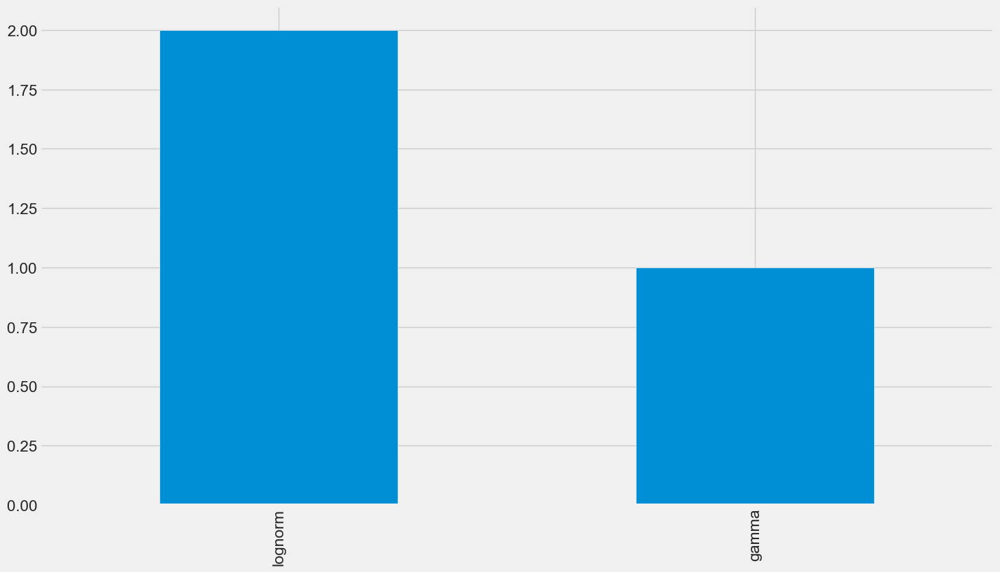

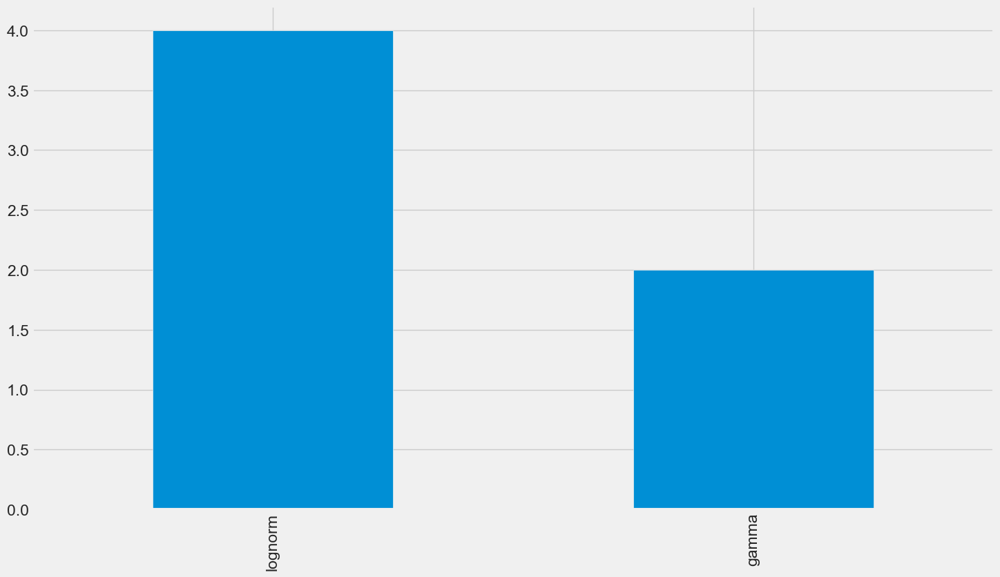

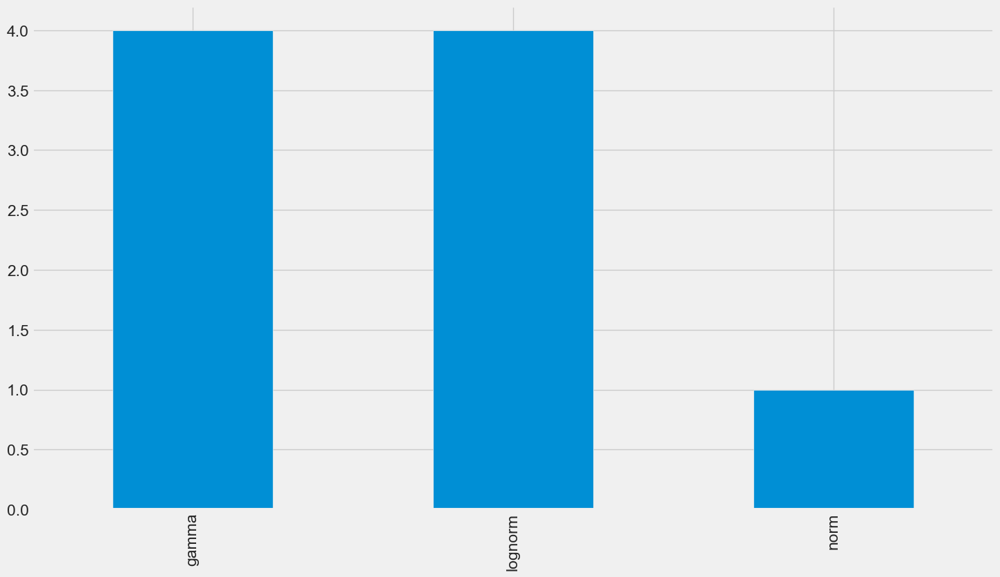

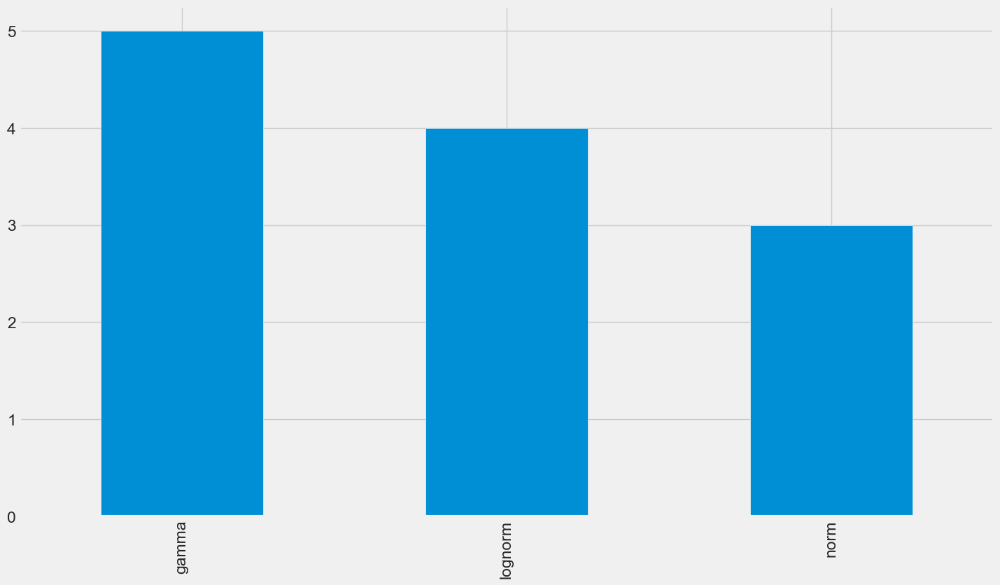

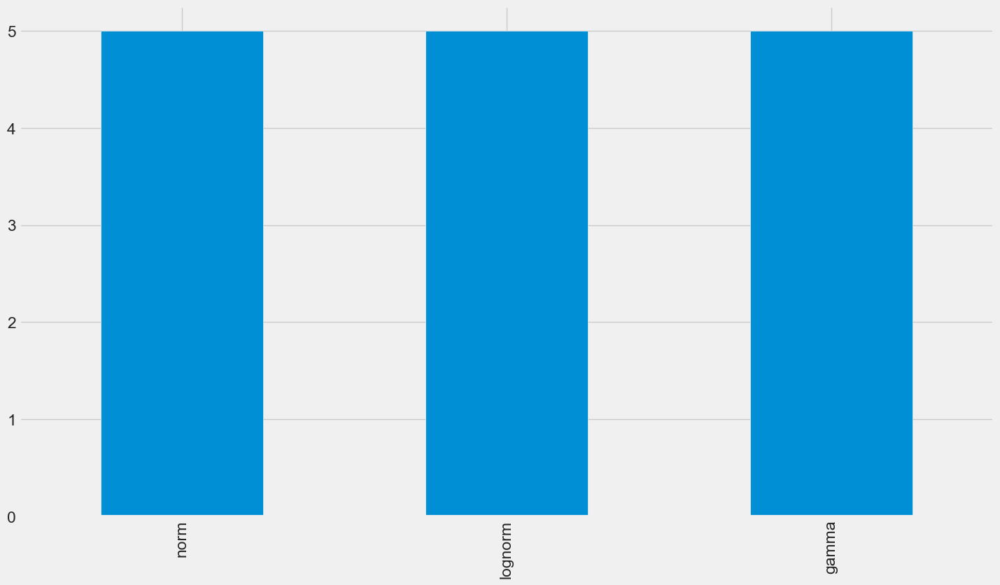

...

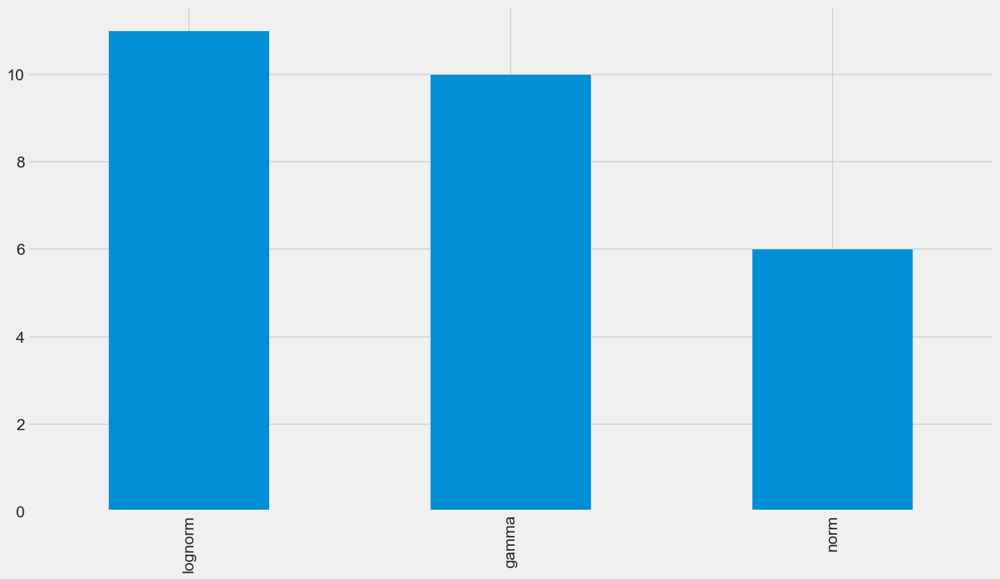

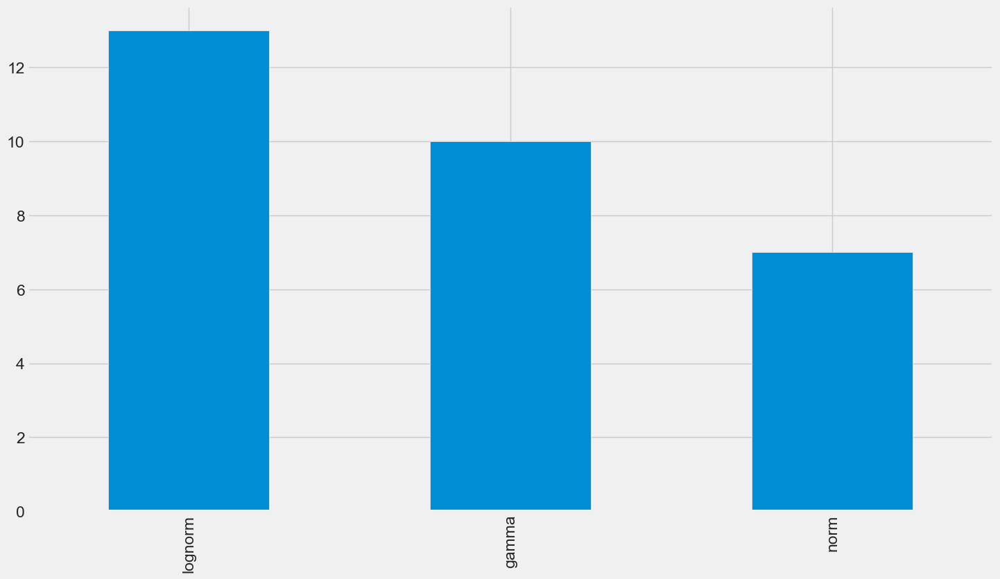

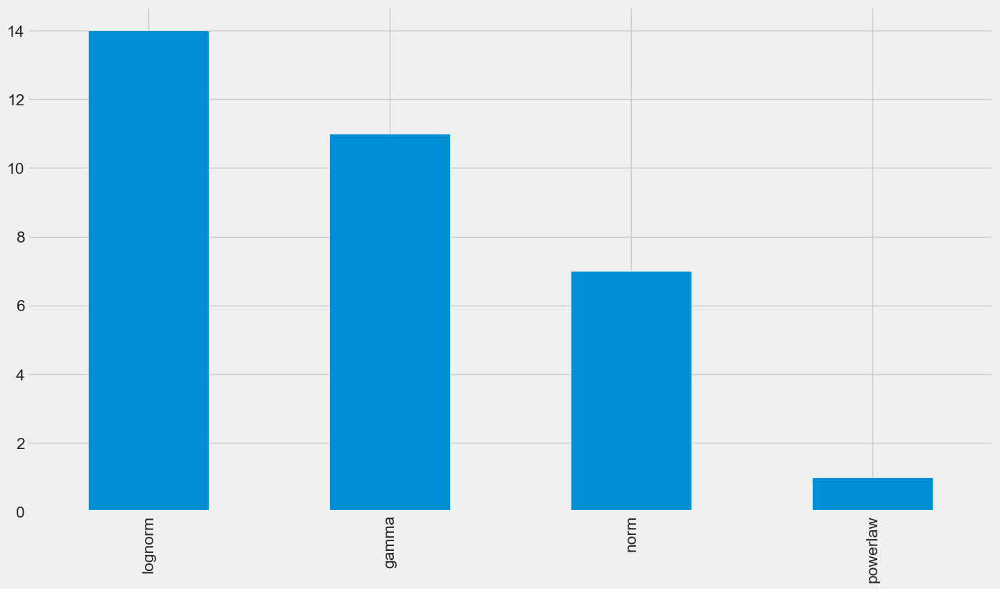

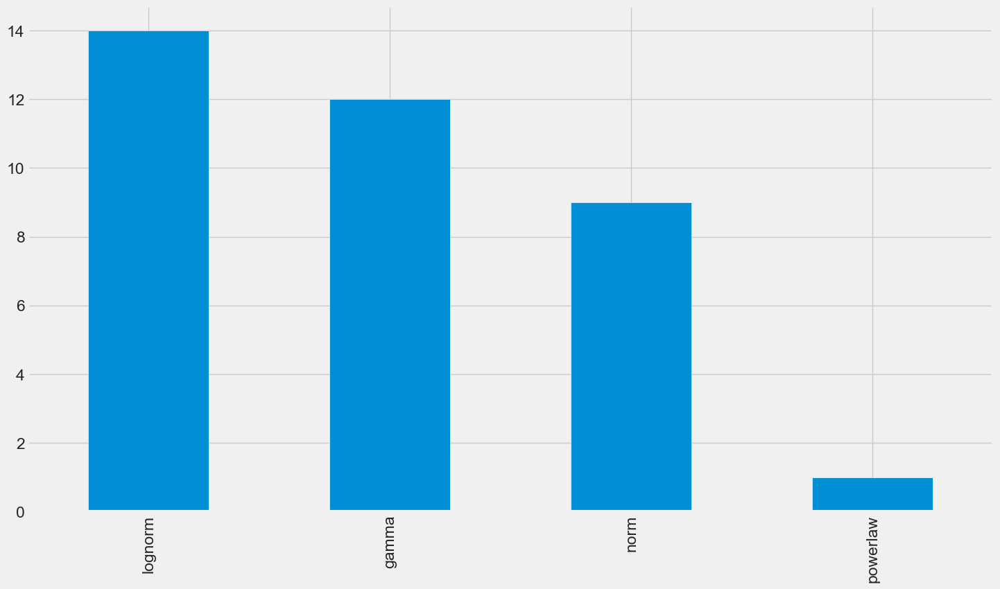

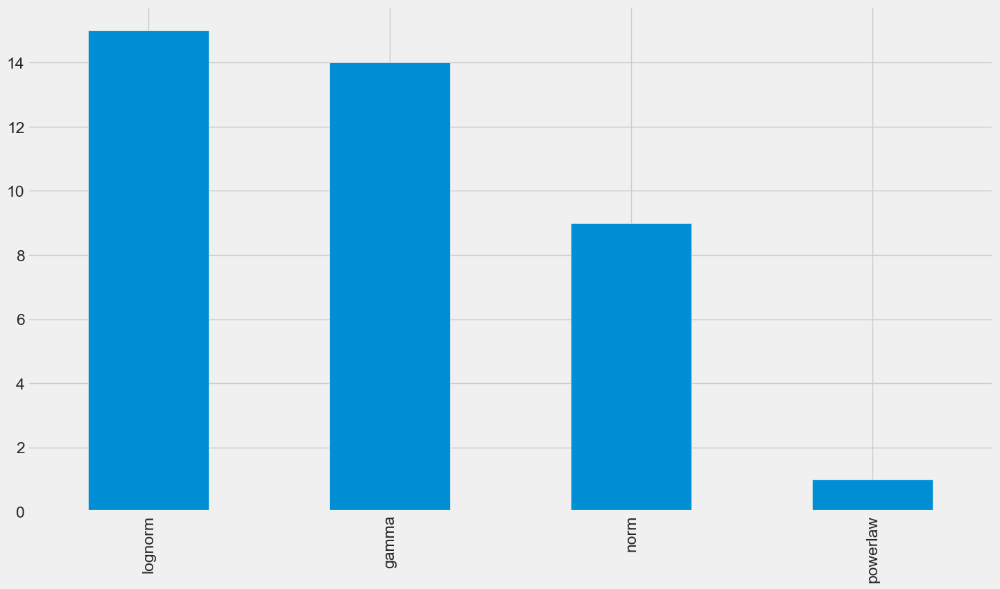

In [164]:
ranked_features = pd.DataFrame({'rank':feature_ranking.keys(),'feature':feature_ranking.values()})
for i in range(1,14):
    cur_features = ranked_features.loc[ranked_features['rank']<=i]['feature'].values.tolist()
    dists_df.loc[dists_df['feature'].isin(cur_features)]['distribution'].value_counts().plot(kind="bar",figsize=[16,9])
    plt.show()

In [169]:
weighted_sum = defaultdict(int)
for k,row in dists_df.iterrows():
    cur_rank = ranked_features.loc[ranked_features['feature']==row['feature']]['rank'].values[0]
    weighted_sum[row['distribution']]+=cur_rank
    
    
for k,count in weighted_sum.items():
    weighted_sum[k] = count/dists_df.loc[dists_df.distribution == k].shape[0]
    
weighted_sum

defaultdict(int,
            {'norm': 6.777777777777778,
             'lognorm': 7.0,
             'gamma': 6.857142857142857,
             'powerlaw': 11.0})

In [165]:
ranked_features

,rank,feature
0,1,flavanoids
1,2,color_intensity
2,3,proline
3,4,od280/od315_of_diluted_wines
4,5,alcohol
5,6,hue
6,7,total_phenols
7,8,alcalinity_of_ash
8,9,malic_acid
9,10,proanthocyanins


In [174]:
groups = [[23,135,3], [123,500,1]]
group_labels = ['views', 'orders']

# Convert data to pandas DataFrame.
df = pd.DataFrame(groups, index=group_labels).T

# Plot.
pd.concat(
    [df.mean().rename('average'), df.min().rename('min'), 
     df.max().rename('max')],
    axis=1)

,average,min,max
views,53.666667,3,135
orders,208.000000,1,500
